### Cell-Cell Communication using CellphoneDB

This script visualizes cell-cell communications using CellPhoneDB (supplementary figure 22). 

In [1]:
import sys
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import networkx as nx

pd.set_option('display.max_columns', 100)
os.chdir('/home/jz3553/CellphoneDB/')
print(sys.version)

3.8.20 (default, Oct  3 2024, 15:24:27) 
[GCC 11.2.0]


### Getting CellphoneDB input

#### Understanding anndata structure 
1. Celltypes are stored as colns in adata.obs[["celltype_A", ... "celltype_N"]] as a df where each barcode is associated with a proportion 0-1 that shows the deconvolved proportions.
2. We can think of each spot as a "single cell" in the context of running CellphoneDB for cell-cell communication.

In [2]:
adata_integrate = sc.read_h5ad("/home/jz3553/CellphoneDB/data/adata_integrate_final_hub_cell_type.h5ad")
print(adata_integrate)

AnnData object with n_obs × n_vars = 232882 × 1133
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'patient', 'sample_type', 'grade', 'leiden', 'pheno_louvain', 'hub', 'Plasma cells', 'Myeloid', 'Fibroblast', 'B cells', 'NK cells', 'Instestinal_Epithelial cells', 'Enterocyte', 'Stomach_epithelial_cells', 'Stomach_stem_cells', 'Endothelial cell', 'Mast cell', 'CD8+ Effector T  cells', 'CD4+ Effector T cells', 'CD4+ Central Memory T cells', 'CD8+ Cytotoxic Unconventional T cells', 'CD8+ Proliferating T cells', 'CD4+ Regulatory T cells', 'CD8+ Homeostatic Unconventional T cells', 'CD8+ Tissue Resident Memory T cells', 'CD8+ Transitioning  Resident T cells', '

In [3]:
print(adata_integrate.obs['hub'].cat.categories.tolist())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34]


In [4]:
print(adata_integrate.obs['hub_celltype'].cat.categories.tolist())

['B cells', 'CD4+ Central Memory T cells', 'CD4+ Effector T cells', 'CD4+ Regulatory T cells', 'CD8+ Cytotoxic Unconventional T cells', 'CD8+ Effector T  cells', 'CD8+ Homeostatic Unconventional T cells', 'CD8+ Proliferating T cells', 'CD8+ Transitioning  Resident T cells', 'Endothelial cell', 'Enterocyte', 'Fibroblast', 'Instestinal_Epithelial cells', 'Intestine_Epithelial Stem cell', 'Mast cell', 'Myeloid', 'NK cells', 'Plasma cells', 'Stomach_Body_Epithelial_cells', 'Stomach_epithelial_cells', 'Stomach_stem_cells']


#### Focusing on crypt-loss and crypt-intact regions
1. To run CellphoneDB, we need two input files per sample:
* anndata object (.h5ad file)
* metadata object that maps spots ("single cell barcodes") to celltypes (.tsv file)

2. For sample 14, create two samples, one is for the crypt-intact region, and the other is for the crypt-loss region. In summary, we are creating a set of anndata object and metadata object per region.  

In [5]:
adata_slv14 = adata_integrate[adata_integrate.obs["sample"] == "SLV14"].copy()

In [6]:
# Rename hub 0 as "T cell mixture (Hub o)" to focus on this subset 
col = "hubcelltype" if "hubcelltype" in adata_slv14.obs.columns else "hub_celltype"
mask = adata_slv14.obs["hub"] == 0
new_label = "T cell mixture (Hub 0)"

if pd.api.types.is_categorical_dtype(adata_slv14.obs[col]):
    if new_label not in adata_slv14.obs[col].cat.categories:
        adata_slv14.obs[col] = (
            adata_slv14.obs[col]
            .cat.add_categories([new_label])
        )
    adata_slv14.obs.loc[mask, col] = new_label
    adata_slv14.obs[col] = adata_slv14.obs[col].cat.remove_unused_categories()
else:
    adata_slv14.obs.loc[mask, col] = new_label

print(adata_slv14.obs.loc[mask, col].unique())

['T cell mixture (Hub 0)']
Categories (22, object): ['B cells', 'CD4+ Central Memory T cells', 'CD4+ Effector T cells', 'CD4+ Regulatory T cells', ..., 'Stomach_Body_Epithelial_cells', 'Stomach_epithelial_cells', 'Stomach_stem_cells', 'T cell mixture (Hub 0)']


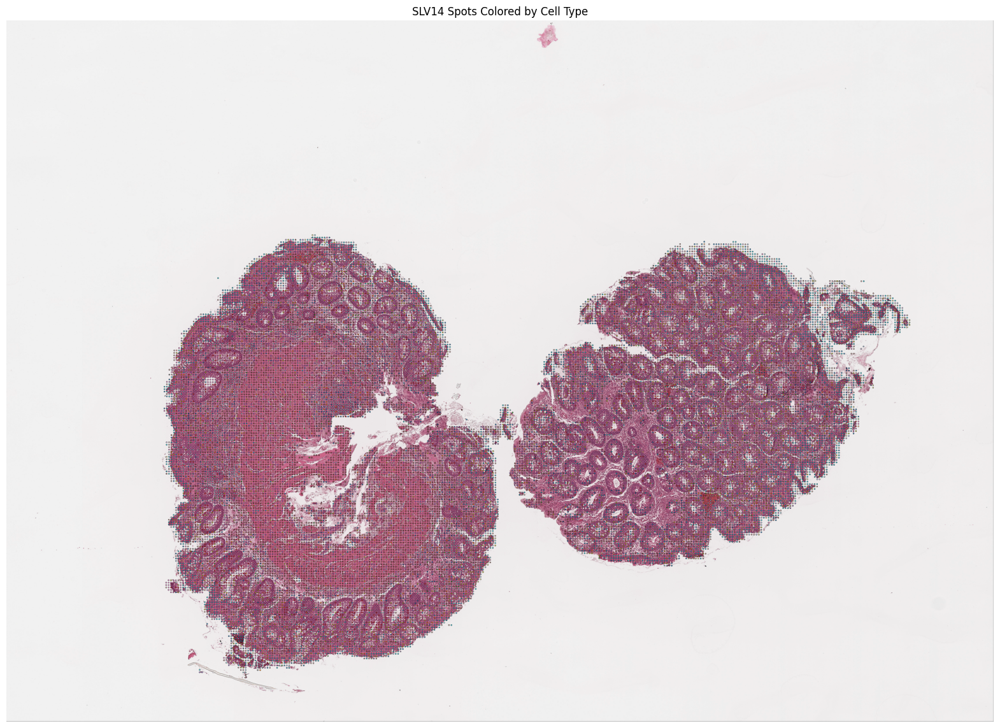

In [7]:
# Visualize histology 
scale_factor = 0.5097273 # can find this in tissue_hires_scalef
coords_visium = adata_slv14.obsm["spatial"]
coords_img = coords_visium * scale_factor
img = adata_integrate.uns["spatial"]["SLV14"]["images"]["hires"]

# Scale coorda into img space 
celltypes = adata_slv14.obs["hub_celltype"].astype("category")
colors = celltypes.cat.codes
cmap = plt.get_cmap("tab20")

plt.figure(figsize=(20, 20))
plt.imshow(img, origin="upper", extent=[0, img.shape[1], img.shape[0], 0])
plt.scatter(
    coords_img[:, 0],
    coords_img[:, 1],
    c=colors,
    cmap=cmap,
    s=2,               
    alpha=0.75,
    edgecolors='black',
    linewidths=0.3
)
plt.xlim(0, img.shape[1])
plt.ylim(img.shape[0], 0)
plt.axis("off")
plt.title("SLV14 Spots Colored by Cell Type")
plt.show()

Define crypt-intact and crypt-loss regions, visualize on the histology. 

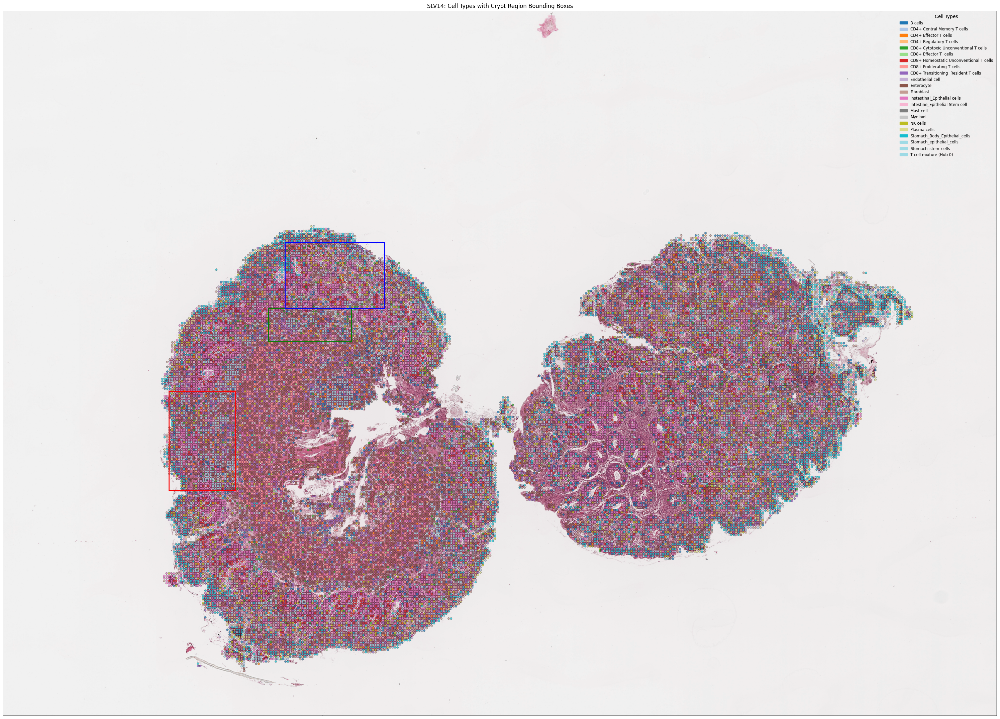

In [8]:
fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(img, origin="upper", extent=[0, img.shape[1], img.shape[0], 0])
scatter = ax.scatter(
    coords_img[:, 0],
    coords_img[:, 1],
    c=colors,
    cmap=cmap,
    s=20,
    alpha=0.75,
    edgecolors='black',
    linewidths=0.3
)

# crypt-loss
rect_loss = patches.Rectangle(
    (1000, 2300), 400, 600, linewidth=2,
    edgecolor="red", facecolor="none", label="Crypt-loss"
)
ax.add_patch(rect_loss)

# crypt-loss 2 
rect_loss2 = patches.Rectangle(
    (1600, 1800),  
    500,           
    200,           
    linewidth=2,
    edgecolor="green",
    facecolor="none",
    label="Crypt-loss2"
)
ax.add_patch(rect_loss2)

# crypt-intact
rect_intact = patches.Rectangle(
    (1700, 1400), 600, 400, linewidth=2,
    edgecolor="blue", facecolor="none", label="Crypt-intact"
)
ax.add_patch(rect_intact)

ax.set_xlim(0, img.shape[1])
ax.set_ylim(img.shape[0], 0)
ax.set_title("SLV14: Cell Types with Crypt Region Bounding Boxes")
ax.axis("off")
ax.legend(loc="upper right")

handles = [
    patches.Patch(color=cmap(i), label=cat)
    for i, cat in enumerate(celltypes.cat.categories)
]
ax.legend(handles=handles, loc='upper right', fontsize='small', frameon=False, title="Cell Types")

plt.tight_layout()
plt.show()

In [9]:
crypt_loss_mask = (
    (coords_img[:, 1] >= 2300) & (coords_img[:, 1] <= 2900) &
    (coords_img[:, 0] >= 1000) & (coords_img[:, 0] <= 1400)
)

crypt_loss2_mask = (
    (coords_img[:, 1] >= 1800) & (coords_img[:, 1] <= 2000) &
    (coords_img[:, 0] >= 1600) & (coords_img[:, 0] <= 2100)
)

crypt_intact_mask = (
    (coords_img[:, 1] >= 1400) & (coords_img[:, 1] <= 1800) &
    (coords_img[:, 0] >= 1700) & (coords_img[:, 0] <= 2300)
)

crypt_loss_mask = crypt_loss_mask | crypt_loss2_mask # combine two loss regions

#### Define cell proportions

In [10]:
regions = {
    "crypt_loss": crypt_loss_mask,
    "crypt_intact": crypt_intact_mask
}

prop_df = pd.DataFrame()
for region_name, mask in regions.items():
    ct_series = adata_slv14.obs.loc[mask, "hub_celltype"]
    props = ct_series.value_counts(normalize=True)
    prop_df[region_name] = props

prop_df = prop_df.fillna(0)
prop_df = prop_df.sort_values("crypt_intact", ascending=False)
prop_df.head(20)

,crypt_loss,crypt_intact
hub_celltype,,
Intestine_Epithelial Stem cell,0.095731,0.253104
T cell mixture (Hub 0),0.212807,0.082139
Plasma cells,0.036223,0.078319
Fibroblast,0.210220,0.076409
Instestinal_Epithelial cells,0.005175,0.066858
Enterocyte,0.011643,0.064947
CD8+ Proliferating T cells,0.016171,0.061127
Stomach_epithelial_cells,0.032342,0.057307
Endothelial cell,0.092497,0.041070


#### Write CellphoneDB input files

In [11]:
adata_crypt_loss = adata_slv14[crypt_loss_mask].copy()
adata_crypt_intact = adata_slv14[crypt_intact_mask].copy()

adata_crypt_loss.write("/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_loss.h5ad")
adata_crypt_intact.write("/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_intact.h5ad")

adata_crypt_loss.obs[["hub_celltype"]].rename(columns={"hub_celltype": "cell_type"}) \
    .to_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_loss_metadata.csv", index_label="barcode")
adata_crypt_intact.obs[["hub_celltype"]].rename(columns={"hub_celltype": "cell_type"}) \
    .to_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_intact_metadata.csv", index_label="barcode")

adata_crypt_loss_check = sc.read_h5ad("/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_loss.h5ad")
adata_crypt_intact_check = sc.read_h5ad("/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_intact.h5ad")

# Check number of spots and hub cell types
print("Crypt Loss:")
print(adata_crypt_loss_check)
print(adata_crypt_loss_check.obs["hub_celltype"].value_counts())

print("\nCrypt Intact:")
print(adata_crypt_intact_check)
print(adata_crypt_intact_check.obs["hub_celltype"].value_counts())

# Load the CSV metadata files
loss_meta_csv = pd.read_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_loss_metadata.csv", index_col=0)
intact_meta_csv = pd.read_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_intact_metadata.csv", index_col=0)

# Show shape and preview
loss_meta_csv_shape = loss_meta_csv.shape
intact_meta_csv_shape = intact_meta_csv.shape
loss_meta_csv_preview = loss_meta_csv.head()
intact_meta_csv_preview = intact_meta_csv.head()

(loss_meta_csv_shape, loss_meta_csv_preview, intact_meta_csv_shape, intact_meta_csv_preview)

# Convert to .tsv
loss_df = pd.read_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_loss_metadata.csv")
loss_df.to_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_loss_meta.tsv", sep="\t", index=False)
intact_df = pd.read_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_intact_metadata.csv")
intact_df.to_csv("/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_intact_meta.tsv", sep="\t", index=False)

Crypt Loss:
AnnData object with n_obs × n_vars = 1546 × 1133
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'patient', 'sample_type', 'grade', 'leiden', 'pheno_louvain', 'hub', 'Plasma cells', 'Myeloid', 'Fibroblast', 'B cells', 'NK cells', 'Instestinal_Epithelial cells', 'Enterocyte', 'Stomach_epithelial_cells', 'Stomach_stem_cells', 'Endothelial cell', 'Mast cell', 'CD8+ Effector T  cells', 'CD4+ Effector T cells', 'CD4+ Central Memory T cells', 'CD8+ Cytotoxic Unconventional T cells', 'CD8+ Proliferating T cells', 'CD4+ Regulatory T cells', 'CD8+ Homeostatic Unconventional T cells', 'CD8+ Tissue Resident Memory T cells', 'CD8+ Transitioning  Resident T

### Run CellphoneDB for SLV14 crypt intact and crypt loss region 

In [12]:
# Define paths for CellPhoneDB inputs and outputs
cpdb_file_path = '/home/jz3553/CellphoneDB/v5.0.0/cellphonedb.zip'
base_path = "/home/jz3553/CellphoneDB/data/M2_Crypt"

loss_meta_path = os.path.join(base_path, "crypt_loss_meta.tsv")
intact_meta_path = os.path.join(base_path, "crypt_intact_meta.tsv")

loss_data_path = "/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_loss.h5ad"
intact_data_path = "/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_intact.h5ad"

loss_output_path = "/home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss"
intact_output_path = "/home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact"

In [13]:
# Load the saved adatas
adata_crypt_loss_check = sc.read_h5ad("/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_loss.h5ad")
adata_crypt_intact_check = sc.read_h5ad("/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_intact.h5ad")

In [14]:
# Run CellPhoneDB for crypt intact region
import multiprocessing
import ktplotspy as kpy
from cellphonedb.src.core.methods import cpdb_statistical_analysis_method
from plotnine import ggsave
from plotnine import facet_wrap

cpdb_results = cpdb_statistical_analysis_method.call(
    cpdb_file_path=cpdb_file_path,
    meta_file_path=intact_meta_path,
    counts_file_path=intact_data_path,
    counts_data="hgnc_symbol",
    score_interactions=True,
    iterations=1000,
    threshold=0.05,
    threads=5,
    debug_seed=42,
    result_precision=3,
    pvalue=0.05,
    subsampling=False,
    subsampling_log=False,
    subsampling_num_pc=100,
    subsampling_num_cells=1000,
    separator='|',
    debug=False,
    output_path=intact_output_path,
    output_suffix=None
)

Reading user files...
The following user files were loaded successfully:
/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_intact.h5ad
/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_intact_meta.tsv
[ ][CORE][07/05/25-21:16:50][INFO] [Cluster Statistical Analysis] Threshold:0.05 Iterations:1000 Debug-seed:42 Threads:5 Precision:3
[ ][CORE][07/05/25-21:16:50][WARNING] Debug random seed enabled. Set to 42
[ ][CORE][07/05/25-21:16:53][INFO] Running Real Analysis
[ ][CORE][07/05/25-21:16:53][INFO] Running Statistical Analysis


100%|███████████████████████████████████████████████████████████████████████| 1000/1000 [00:26<00:00, 37.10it/s]


[ ][CORE][07/05/25-21:17:21][INFO] Building Pvalues result
[ ][CORE][07/05/25-21:17:21][INFO] Building results
[ ][CORE][07/05/25-21:17:21][INFO] Scoring interactions: Filtering genes per cell type..


100%|██████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 238.32it/s]

[ ][CORE][07/05/25-21:17:22][INFO] Scoring interactions: Calculating mean expression of each gene per group/cell type..



100%|██████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 632.65it/s]


[ ][CORE][07/05/25-21:17:22][INFO] Scoring interactions: Calculating scores for all interactions and cell types..


100%|█████████████████████████████████████████████████████████████████████████| 484/484 [00:08<00:00, 56.85it/s]


Saved deconvoluted to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact/statistical_analysis_deconvoluted_05_07_2025_211732.txt
Saved deconvoluted_percents to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact/statistical_analysis_deconvoluted_percents_05_07_2025_211732.txt
Saved means to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact/statistical_analysis_means_05_07_2025_211732.txt
Saved pvalues to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact/statistical_analysis_pvalues_05_07_2025_211732.txt
Saved significant_means to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact/statistical_analysis_significant_means_05_07_2025_211732.txt
Saved interaction_scores to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_intact/statistical_analysis_interaction_scores_05_07_2025_211732.txt


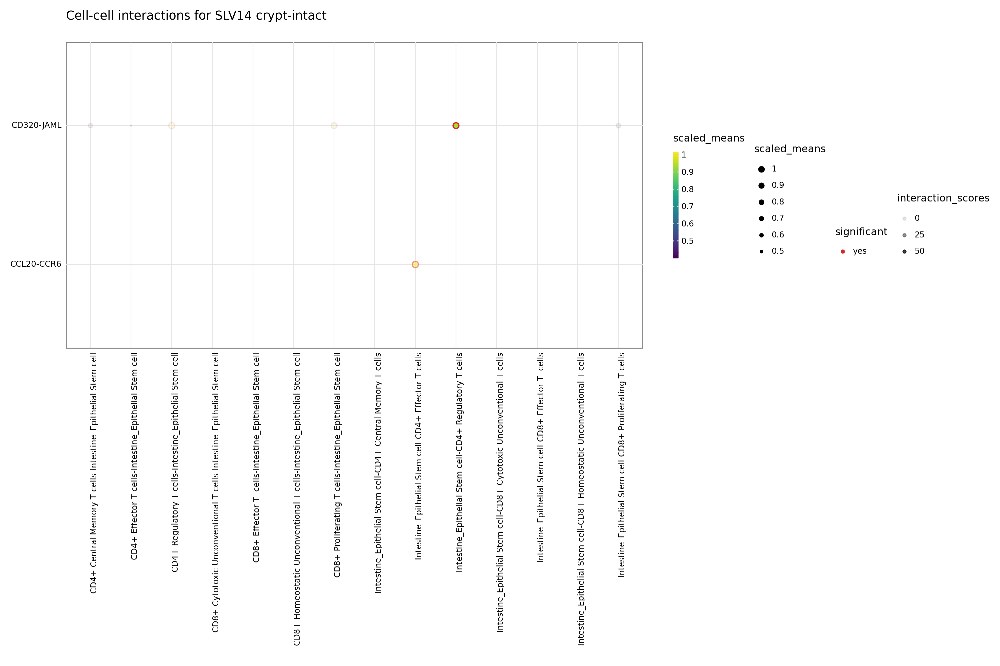

<Figure Size: (1500 x 1000)>

In [15]:
# Generate the plot
p = kpy.plot_cpdb(
    adata=adata_crypt_intact_check,
    cell_type1="CD8+ Effector T  cells|CD4+ Central Memory T cells|CD4+ Regulatory T cells|CD4+ Effector T cells|CD8+ Cytotoxic Unconventional T cells|CD8+ Homeostatic Unconventional T cells|CD8+ Proliferating T cells",
    cell_type2= "Intestine_Epithelial Stem cell", #"Intestine_Epithelial Stem cell""Stomach_stem_cells"
    means=cpdb_results['means'],
    pvals=cpdb_results['pvalues'],
    celltype_key="hub_celltype",
    figsize=(15, 10),
    title=f"Cell-cell interactions for SLV14 crypt-intact",
    max_size=3,
    highlight_size=0.75,
    degs_analysis=False,
    standard_scale=True,
    interaction_scores=cpdb_results['interaction_scores'],
    scale_alpha_by_interaction_scores=True
)

p

In [16]:
# Run CellPhoneDB for crypt loss region

cpdb_results_loss = cpdb_statistical_analysis_method.call(
    cpdb_file_path=cpdb_file_path,
    meta_file_path=loss_meta_path,
    counts_file_path=loss_data_path,
    counts_data="hgnc_symbol",
    score_interactions=True,
    iterations=1000,
    threshold=0.01,
    threads=5,
    debug_seed=42,
    result_precision=3,
    pvalue=0.05,
    subsampling=False,
    subsampling_log=False,
    subsampling_num_pc=100,
    subsampling_num_cells=1000,
    separator='|',
    debug=False,
    output_path=loss_output_path,
    output_suffix=None
)

Reading user files...
The following user files were loaded successfully:
/home/jz3553/CellphoneDB/data/M2_Crypt/adata_crypt_loss.h5ad
/home/jz3553/CellphoneDB/data/M2_Crypt/crypt_loss_meta.tsv
[ ][CORE][07/05/25-21:17:49][INFO] [Cluster Statistical Analysis] Threshold:0.01 Iterations:1000 Debug-seed:42 Threads:5 Precision:3
[ ][CORE][07/05/25-21:17:49][WARNING] Debug random seed enabled. Set to 42
[ ][CORE][07/05/25-21:17:49][INFO] Running Real Analysis
[ ][CORE][07/05/25-21:17:49][INFO] Running Statistical Analysis


100%|███████████████████████████████████████████████████████████████████████| 1000/1000 [00:33<00:00, 29.41it/s]


[ ][CORE][07/05/25-21:18:24][INFO] Building Pvalues result
[ ][CORE][07/05/25-21:18:24][INFO] Building results
[ ][CORE][07/05/25-21:18:24][INFO] Scoring interactions: Filtering genes per cell type..


100%|██████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 268.97it/s]

[ ][CORE][07/05/25-21:18:25][INFO] Scoring interactions: Calculating mean expression of each gene per group/cell type..



100%|██████████████████████████████████████████████████████████████████████████| 22/22 [00:00<00:00, 697.86it/s]


[ ][CORE][07/05/25-21:18:25][INFO] Scoring interactions: Calculating scores for all interactions and cell types..


100%|█████████████████████████████████████████████████████████████████████████| 484/484 [00:08<00:00, 56.57it/s]


Saved deconvoluted to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss/statistical_analysis_deconvoluted_05_07_2025_211835.txt
Saved deconvoluted_percents to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss/statistical_analysis_deconvoluted_percents_05_07_2025_211835.txt
Saved means to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss/statistical_analysis_means_05_07_2025_211835.txt
Saved pvalues to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss/statistical_analysis_pvalues_05_07_2025_211835.txt
Saved significant_means to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss/statistical_analysis_significant_means_05_07_2025_211835.txt
Saved interaction_scores to /home/jz3553/CellphoneDB/results/M2_Crypt/crypt_loss/statistical_analysis_interaction_scores_05_07_2025_211835.txt


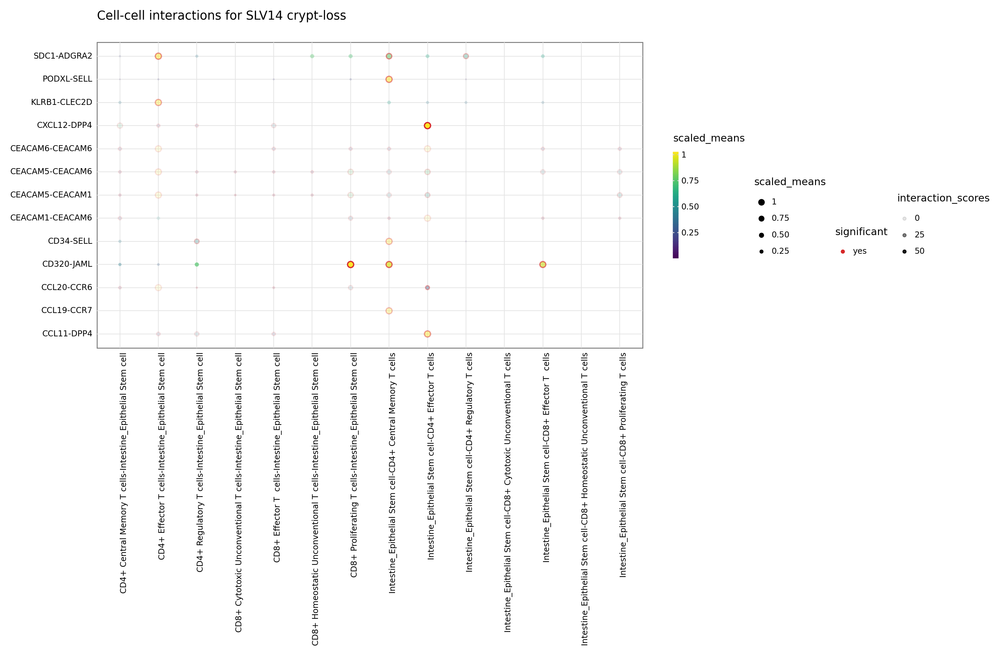

<Figure Size: (1500 x 1000)>

In [17]:
# Generate the plot
p = kpy.plot_cpdb(
    adata=adata_crypt_loss_check,
    cell_type1="CD8+ Effector T  cells|CD4+ Central Memory T cells|CD4+ Regulatory T cells|CD4+ Effector T cells|CD8+ Cytotoxic Unconventional T cells|CD8+ Homeostatic Unconventional T cells|CD8+ Proliferating T cells",
    cell_type2= "Intestine_Epithelial Stem cell", 
    means=cpdb_results_loss['means'],
    pvals=cpdb_results_loss['pvalues'],
    celltype_key="hub_celltype",
    figsize=(15, 10),
    title=f"Cell-cell interactions for SLV14 crypt-loss",
    max_size=3,
    highlight_size=0.75,
    degs_analysis=False,
    standard_scale=True,
    interaction_scores=cpdb_results_loss['interaction_scores'],
    scale_alpha_by_interaction_scores=True
)

p

### Visualize results

In [18]:
print("All keys:", list(cpdb_results.keys()))

All keys: ['deconvoluted', 'deconvoluted_percents', 'means', 'pvalues', 'significant_means', 'CellSign_active_interactions', 'CellSign_active_interactions_deconvoluted', 'interaction_scores']


In [19]:
def long_format(df_scores, df_pvals=None, name="Dataset"):
    cellpair_cols = [c for c in df_scores.columns if "|" in c]
    meta_cols     = [c for c in df_scores.columns if c not in cellpair_cols]

    df_long = df_scores.melt(
        id_vars=meta_cols,
        value_vars=cellpair_cols,
        var_name="cell_pair",
        value_name="score"
    )

    if df_pvals is not None:
        df_p = df_pvals.melt(
            id_vars=meta_cols,
            value_vars=cellpair_cols,
            var_name="cell_pair",
            value_name="pval"
        )
        df_long = df_long.merge(df_p, on=meta_cols + ["cell_pair"])

    df_long["dataset"] = name
    return df_long[["interacting_pair", "cell_pair", "score", "pval", "dataset"]]

In [20]:
df_intact = long_format(
    cpdb_results["interaction_scores"],
    df_pvals=cpdb_results["pvalues"],
    name="Intact"
)
df_loss = long_format(
    cpdb_results_loss["interaction_scores"],
    df_pvals=cpdb_results_loss["pvalues"],
    name="Loss"
)
combined = pd.concat([df_intact, df_loss], ignore_index=True)

In [21]:
import matplotlib as mpl
mpl.rcParams.update({'font.size': 8, 'svg.fonttype': 'none'})

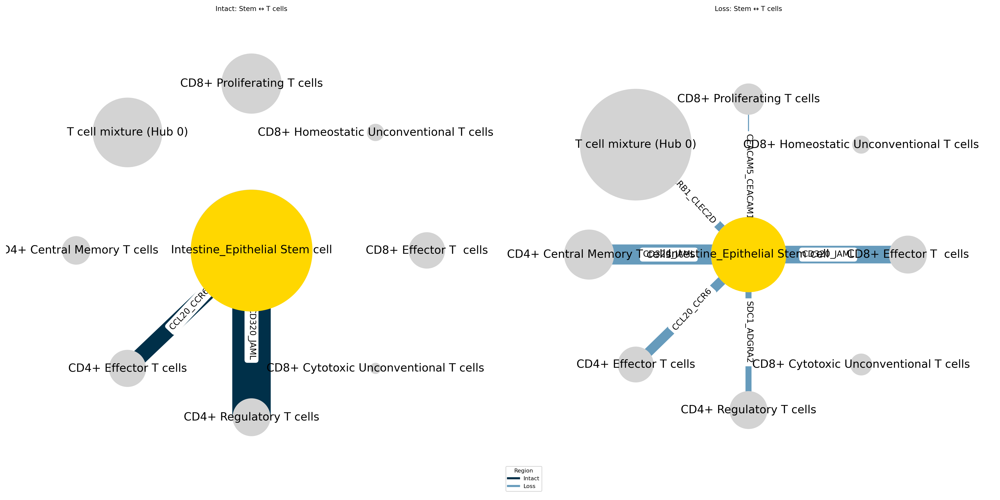

In [22]:
from matplotlib.lines import Line2D

stem = "Intestine_Epithelial Stem cell"
t_cells = [
    "CD8+ Effector T  cells",
    "CD4+ Central Memory T cells",
    "CD4+ Regulatory T cells",
    "CD4+ Effector T cells",
    "CD8+ Cytotoxic Unconventional T cells",
    "CD8+ Homeostatic Unconventional T cells",
    "CD8+ Proliferating T cells", 
    "T cell mixture (Hub 0)"] # focus on t cell interactions 

mask = combined["cell_pair"].apply(
    lambda cp: stem in cp and any(tc in cp for tc in t_cells)
)
df_net = combined[mask].copy()
datasets = ["Intact", "Loss"]
color_map = {"Intact": '#003049', "Loss": '#669BBC'}

fig, axes = plt.subplots(1, len(datasets), figsize=(20, 10), sharey=False)

for ax, ds in zip(axes, datasets):
    df_ds = df_net[df_net["dataset"] == ds]
    G = nx.Graph()
    G.add_node(stem)
    
    for _, row in df_ds.iterrows():
        a, b = row["cell_pair"].split("|")
        partner = b if a == stem else a
        
        G.add_node(partner)
        if row["pval"] < 0.05:
            G.add_edge(stem, partner,
                       weight=row["score"],
                       lrs=[row["interacting_pair"]])
    
    pos = nx.shell_layout(G, nlist=[[stem], [n for n in G if n != stem]])
    
    size_key = "crypt_intact" if ds == "Intact" else "crypt_loss"
    node_sizes = [
        prop_df.at[n, size_key] * 6000 * 20
        for n in G.nodes()
    ]
    
    edge_widths = [G.edges[e]["weight"] * 0.8 for e in G.edges()]
    
    nx.draw_networkx_nodes(G, pos,
                           node_size=node_sizes,
                           node_color="lightgrey",
                           ax=ax)
    nx.draw_networkx_nodes(G, pos,
                           nodelist=[stem],
                           node_size=node_sizes[list(G.nodes()).index(stem)],
                           node_color="gold",
                           ax=ax)
    nx.draw_networkx_edges(G, pos,
                           edgelist=G.edges(),
                           width=edge_widths,
                           edge_color=color_map[ds],
                           ax=ax)
    nx.draw_networkx_labels(G, pos, font_size=16, ax=ax)
    
    edge_labels = {(u, v): ", ".join(d["lrs"])
                   for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos,
                                 edge_labels=edge_labels,
                                 font_size=12, ax=ax, clip_on=False)
    
    ax.set_title(f"{ds}: Stem ↔ T cells")
    ax.margins(0.2)      
    ax.axis("off")

legend_items = [
    Line2D([0], [0], color=color_map[d], lw=3, label=d)
    for d in datasets
]
axes[-1].legend(handles=legend_items, title="Region", loc="lower left")
plt.tight_layout()

# # Save plots 
# out_base = "/home/jz3553/stem_Tcell_network"          
# for fmt in ("pdf", "svg", "png"):
#     fig.savefig(f"{out_base}.{fmt}",
#                 format=fmt,
#                 bbox_inches="tight",    
#                 dpi=300 if fmt == "png" else None)